In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024371.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024358.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024337.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024382.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024420.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024409.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration

**PART-1: DATA STORY**


**Importing Libraries**

In [2]:
import os
import re
import glob
import pathlib
import time
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline


import PIL
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle  
from sklearn.metrics import confusion_matrix
from sklearn.utils import class_weight

from collections import Counter

from warnings import filterwarnings
filterwarnings('ignore')

SEED=123
np.random.seed(SEED)

**Declaring Path**

In [3]:
df_eda = pd.DataFrame()

classes = []
train_image_number_breakdown = {}
test_image_number_breakdown = {}
number_test_images = 0
number_train_images = 0
for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train"):
    classes.append(class_name)
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train",class_name)
    count = len([entry for entry in os.listdir(path) if os.path.isfile(os.path.join(path, entry))]) 
    train_image_number_breakdown[class_name] = count
    number_train_images += count


for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test"):
    classes.append(class_name)
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test",class_name)
    count = len([entry for entry in os.listdir(path) if os.path.isfile(os.path.join(path, entry))]) 
    test_image_number_breakdown[class_name] = count
    number_test_images += count

classes = list(set(classes))

 **Data Understanding**

In [4]:
print("Number of Train Images {}".format(number_train_images))
print("Number of Test Images {}".format(number_test_images))
print("##"*25)
print("Train Images Breakdown {}".format(train_image_number_breakdown))
print("__"*25)
print("Test Images Breakdown {}".format(test_image_number_breakdown))
print("##"*25)
print("Classes {}".format(classes))

Number of Train Images 2239
Number of Test Images 118
##################################################
Train Images Breakdown {'pigmented benign keratosis': 462, 'melanoma': 438, 'vascular lesion': 139, 'actinic keratosis': 114, 'squamous cell carcinoma': 181, 'basal cell carcinoma': 376, 'seborrheic keratosis': 77, 'dermatofibroma': 95, 'nevus': 357}
__________________________________________________
Test Images Breakdown {'pigmented benign keratosis': 16, 'melanoma': 16, 'vascular lesion': 3, 'actinic keratosis': 16, 'squamous cell carcinoma': 16, 'basal cell carcinoma': 16, 'seborrheic keratosis': 3, 'dermatofibroma': 16, 'nevus': 16}
##################################################
Classes ['dermatofibroma', 'squamous cell carcinoma', 'vascular lesion', 'pigmented benign keratosis', 'seborrheic keratosis', 'actinic keratosis', 'basal cell carcinoma', 'melanoma', 'nevus']


In [5]:
train_skin_df = pd.DataFrame()
classes = []
images = []
for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train"):
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train",class_name)
    for image in os.listdir(path):
        classes.append(class_name)
        images.append(os.path.join(path,image))
train_skin_df["cell_type"] = classes
train_skin_df["image"] = images

In [6]:
train_skin_df.head(10)

,cell_type,image
0,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
1,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
2,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
3,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
4,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
5,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
6,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
7,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
8,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
9,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...


In [7]:
train_skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2239 entries, 0 to 2238
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   cell_type  2239 non-null   object
 1   image      2239 non-null   object
dtypes: object(2)
memory usage: 35.1+ KB


In [8]:
train_skin_df.describe()

,cell_type,image
count,2239,2239
unique,9,2239
top,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
freq,462,1


In [9]:
train_skin_df.dropna()

,cell_type,image
0,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
1,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
2,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
3,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
4,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
...,...,...
2234,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
2235,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
2236,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
2237,nevus,../input/skin-cancer9-classesisic/Skin cancer ...


In [10]:
train_skin_df.nunique()

cell_type       9
image        2239
dtype: int64

In [11]:
train_skin_df.columns

Index(['cell_type', 'image'], dtype='object')

**Visualising Data**

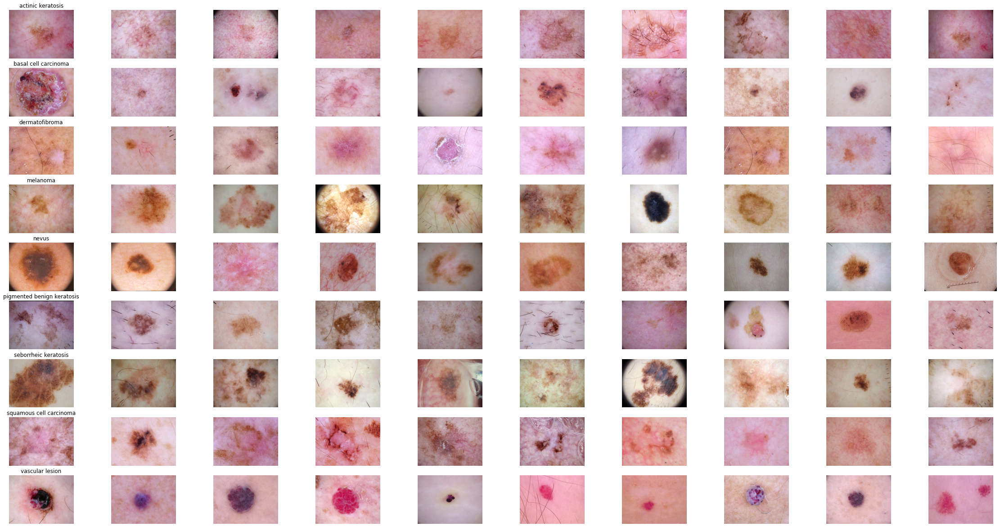

In [12]:
%matplotlib inline
from matplotlib import pyplot as plt
import skimage.io
import skimage.color
n_samples = 10
fig, m_axs = plt.subplots(9, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         train_skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        image = skimage.io.imread(c_row['image'])
        c_ax.imshow(image)
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

**CLASSES:
1.MELANOMA**

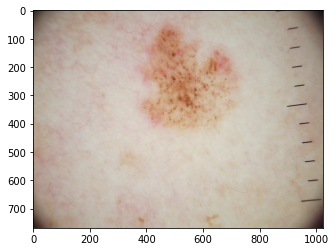

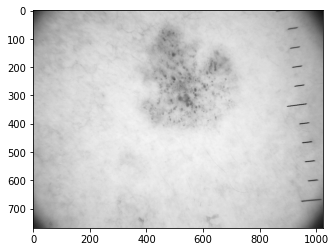

In [13]:
image1 = skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/melanoma/ISIC_0009927.jpg")
fig, ax = plt.subplots()
plt.imshow(image1)

gray_image = skimage.color.rgb2gray(image1)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

**Converting image to readable array**

In [14]:
image1

array([[[42, 31, 25],
        [45, 36, 31],
        [45, 36, 31],
        ...,
        [16, 15, 13],
        [16, 15, 13],
        [16, 15, 13]],

       [[42, 33, 28],
        [45, 36, 31],
        [46, 37, 32],
        ...,
        [17, 16, 14],
        [17, 16, 14],
        [16, 15, 13]],

       [[44, 35, 30],
        [47, 38, 33],
        [47, 38, 33],
        ...,
        [18, 17, 15],
        [17, 16, 14],
        [17, 16, 14]],

       ...,

       [[42, 27, 22],
        [45, 30, 25],
        [48, 33, 28],
        ...,
        [27, 19, 17],
        [27, 19, 17],
        [26, 18, 16]],

       [[41, 26, 21],
        [43, 28, 23],
        [45, 30, 25],
        ...,
        [26, 18, 16],
        [25, 17, 15],
        [25, 17, 15]],

       [[43, 28, 23],
        [43, 28, 23],
        [43, 28, 23],
        ...,
        [24, 16, 14],
        [23, 15, 13],
        [23, 15, 13]]], dtype=uint8)

**Visualising the Individual RGB Color Channels**

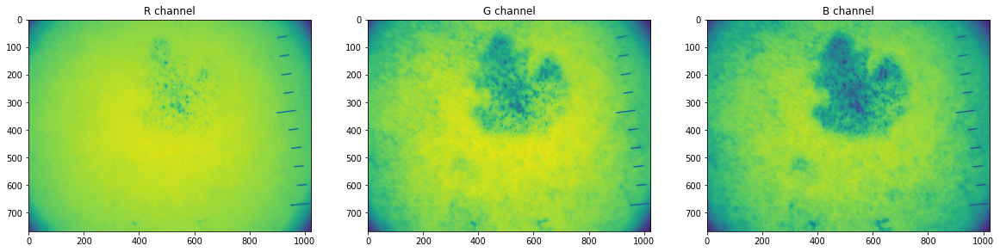

In [15]:
r = image1[:,:,0]
g = image1[:,:,1]
b = image1[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**2.NEVUS**

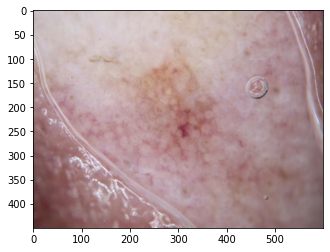

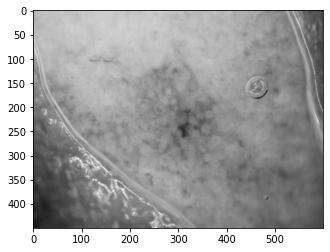

In [16]:
image2 = skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/nevus/ISIC_0026848.jpg")
plt.imshow(image2)

gray_image = skimage.color.rgb2gray(image2)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

**Converting image to readable array**

In [17]:
image2

array([[[199, 188, 186],
        [202, 188, 188],
        [201, 184, 190],
        ...,
        [111,  65,  67],
        [105,  60,  57],
        [106,  57,  52]],

       [[201, 189, 189],
        [203, 189, 189],
        [201, 189, 193],
        ...,
        [114,  69,  72],
        [104,  58,  60],
        [106,  58,  54]],

       [[203, 191, 191],
        [203, 191, 191],
        [203, 193, 194],
        ...,
        [118,  73,  78],
        [111,  65,  67],
        [108,  60,  60]],

       ...,

       [[ 86,  46,  46],
        [ 85,  45,  43],
        [ 85,  45,  45],
        ...,
        [104,  84,  86],
        [104,  84,  86],
        [103,  83,  85]],

       [[ 84,  44,  44],
        [ 85,  45,  45],
        [ 85,  45,  43],
        ...,
        [105,  85,  87],
        [105,  85,  87],
        [106,  86,  88]],

       [[ 83,  44,  45],
        [ 85,  47,  44],
        [ 84,  47,  41],
        ...,
        [105,  85,  87],
        [105,  85,  87],
        [106,  86,  88]]

**Visualising the Individual RGB Color Channels**

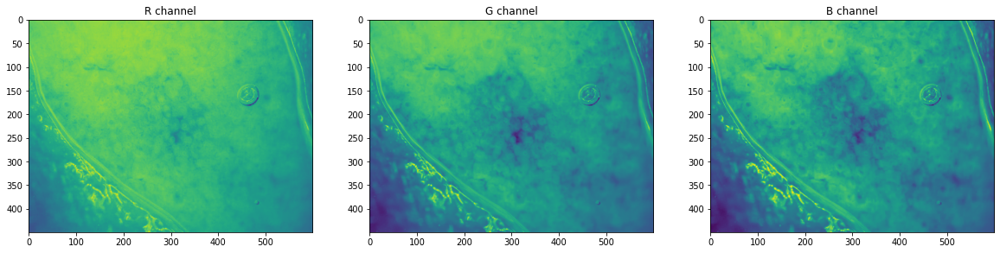

In [18]:
r = image2[:,:,0]
g = image2[:,:,1]
b = image2[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**3.BASAL CELL CARCINOMA**

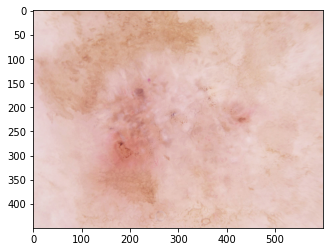

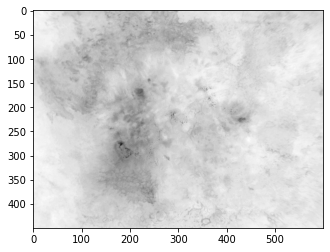

In [19]:
image3=skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/basal cell carcinoma/ISIC_0028568.jpg")
plt.imshow(image3)

gray_image = skimage.color.rgb2gray(image3)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [20]:
image3

array([[[230, 209, 206],
        [231, 210, 207],
        [230, 209, 206],
        ...,
        [224, 195, 191],
        [224, 194, 192],
        [223, 195, 191]],

       [[230, 209, 206],
        [231, 210, 207],
        [229, 210, 206],
        ...,
        [223, 193, 191],
        [224, 195, 191],
        [225, 197, 193]],

       [[231, 210, 207],
        [231, 210, 207],
        [231, 210, 207],
        ...,
        [223, 195, 191],
        [224, 194, 192],
        [224, 196, 192]],

       ...,

       [[228, 207, 204],
        [229, 208, 205],
        [231, 210, 207],
        ...,
        [231, 201, 199],
        [233, 205, 202],
        [234, 203, 201]],

       [[226, 205, 204],
        [228, 207, 204],
        [230, 209, 204],
        ...,
        [231, 202, 198],
        [232, 203, 199],
        [233, 204, 200]],

       [[227, 206, 205],
        [228, 207, 204],
        [230, 209, 204],
        ...,
        [230, 202, 199],
        [229, 201, 198],
        [229, 201, 198]]

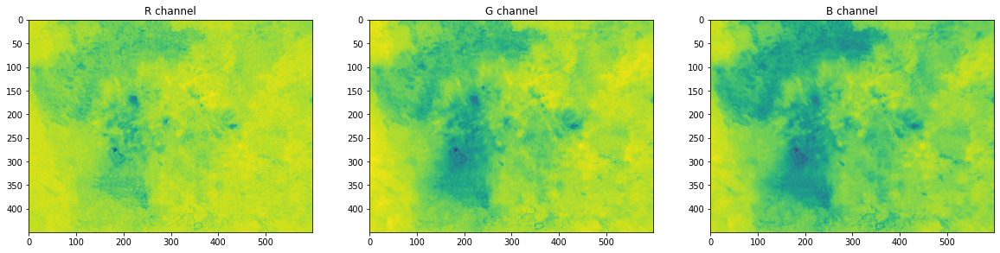

In [21]:
r = image3[:,:,0]
g = image3[:,:,1]
b = image3[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**4.DERMATOFIBROMA**

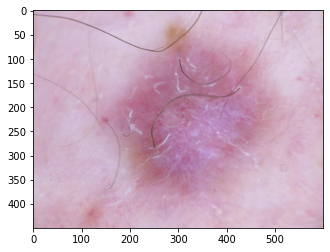

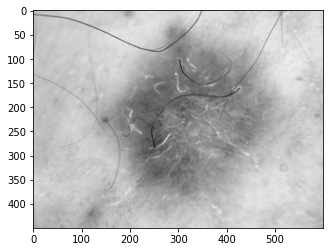

In [22]:
image4=skimage.io.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/dermatofibroma/ISIC_0031827.jpg")
plt.imshow(image4)

gray_image = skimage.color.rgb2gray(image4)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [23]:
image4

array([[[204, 172, 193],
        [203, 171, 192],
        [205, 172, 189],
        ...,
        [211, 187, 201],
        [208, 188, 200],
        [208, 188, 200]],

       [[204, 172, 195],
        [203, 171, 192],
        [203, 171, 192],
        ...,
        [212, 190, 203],
        [212, 190, 203],
        [212, 190, 203]],

       [[204, 172, 196],
        [203, 171, 194],
        [203, 171, 194],
        ...,
        [212, 192, 204],
        [214, 192, 204],
        [214, 192, 204]],

       ...,

       [[192, 156, 168],
        [194, 158, 170],
        [195, 159, 173],
        ...,
        [196, 161, 181],
        [195, 161, 178],
        [197, 158, 177]],

       [[192, 154, 167],
        [192, 156, 168],
        [191, 159, 174],
        ...,
        [196, 161, 183],
        [195, 160, 180],
        [197, 160, 178]],

       [[191, 153, 164],
        [192, 154, 165],
        [191, 157, 171],
        ...,
        [195, 160, 180],
        [196, 159, 177],
        [196, 159, 177]]

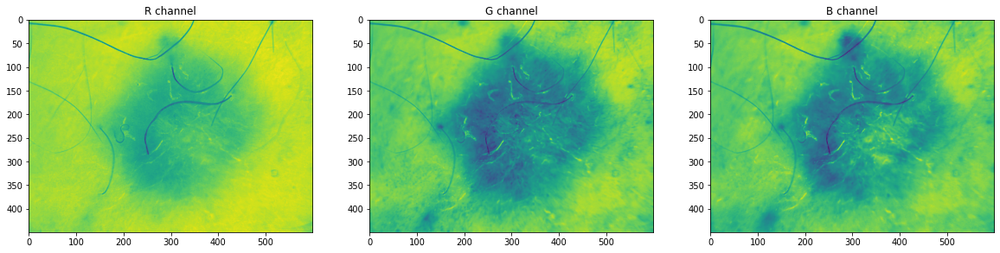

In [24]:
r = image4[:,:,0]
g = image4[:,:,1]
b = image4[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**5.SEBORRHEIC KERATOSIS**

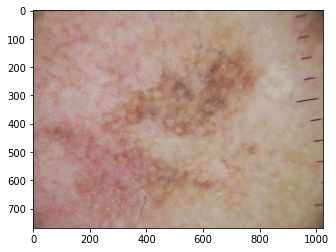

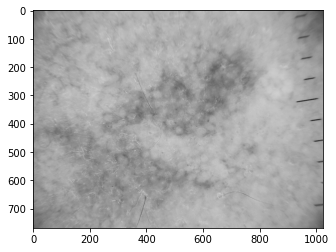

In [25]:
image5=skimage.io.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/seborrheic keratosis/ISIC_0011077.jpg")
plt.imshow(image5)

gray_image = skimage.color.rgb2gray(image5)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [26]:
image5

array([[[123,  88,  82],
        [125,  90,  84],
        [125,  90,  84],
        ...,
        [ 89,  66,  58],
        [ 83,  63,  56],
        [ 79,  59,  52]],

       [[124,  89,  83],
        [125,  90,  84],
        [124,  89,  83],
        ...,
        [ 89,  66,  58],
        [ 85,  65,  56],
        [ 83,  63,  54]],

       [[123,  90,  83],
        [124,  91,  84],
        [123,  90,  83],
        ...,
        [ 88,  66,  55],
        [ 87,  67,  58],
        [ 87,  67,  58]],

       ...,

       [[123,  86,  80],
        [122,  85,  79],
        [122,  85,  77],
        ...,
        [104,  82,  68],
        [101,  79,  65],
        [101,  80,  63]],

       [[120,  83,  77],
        [117,  80,  74],
        [117,  80,  72],
        ...,
        [100,  78,  64],
        [ 98,  76,  62],
        [ 97,  75,  61]],

       [[119,  82,  76],
        [116,  79,  73],
        [116,  79,  71],
        ...,
        [ 97,  75,  61],
        [ 98,  76,  62],
        [ 96,  74,  60]]

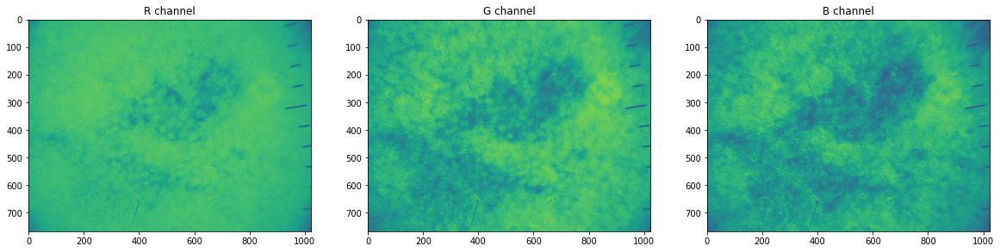

In [27]:
r = image5[:,:,0]
g = image5[:,:,1]
b = image5[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**6.BASAL CELL CARCINOMA**

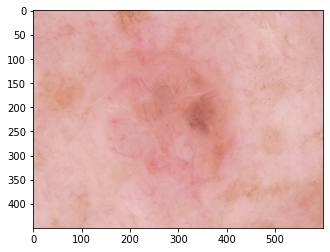

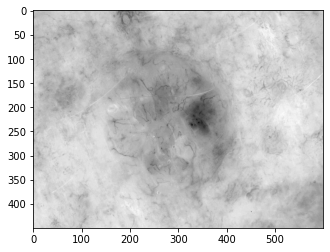

In [28]:
image6=skimage.io.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/basal cell carcinoma/ISIC_0029602.jpg")
plt.imshow(image6)

gray_image = skimage.color.rgb2gray(image6)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [29]:
image6

array([[[220, 171, 167],
        [220, 170, 163],
        [218, 168, 161],
        ...,
        [225, 177, 173],
        [225, 177, 173],
        [223, 175, 171]],

       [[220, 171, 167],
        [220, 171, 166],
        [219, 170, 163],
        ...,
        [224, 176, 172],
        [223, 178, 173],
        [224, 175, 171]],

       [[220, 166, 164],
        [219, 168, 164],
        [216, 167, 162],
        ...,
        [222, 177, 172],
        [223, 178, 173],
        [224, 175, 171]],

       ...,

       [[224, 187, 178],
        [225, 187, 178],
        [224, 187, 179],
        ...,
        [216, 159, 140],
        [214, 157, 137],
        [215, 158, 139]],

       [[224, 187, 178],
        [224, 187, 178],
        [224, 187, 179],
        ...,
        [213, 156, 137],
        [214, 157, 138],
        [213, 156, 137]],

       [[224, 187, 178],
        [224, 187, 178],
        [224, 187, 179],
        ...,
        [212, 155, 136],
        [212, 155, 136],
        [209, 152, 133]]

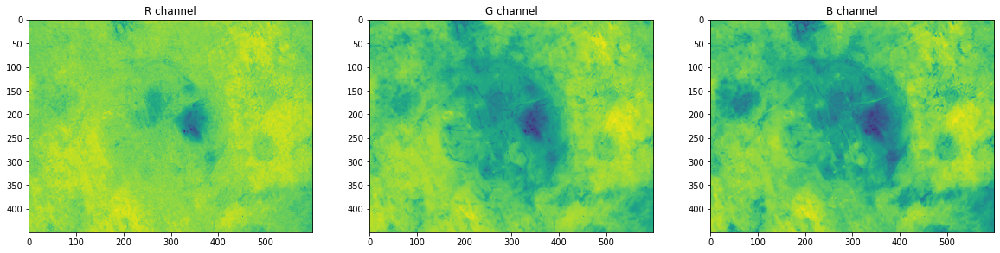

In [30]:
r = image6[:,:,0]
g = image6[:,:,1]
b = image6[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**7.ACTINIC KERATOSIS**

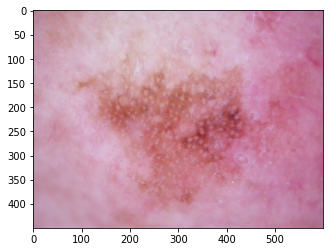

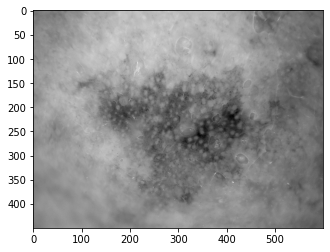

In [31]:
image7=skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/ISIC_0033358.jpg")
plt.imshow(image7)

gray_image = skimage.color.rgb2gray(image7)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [32]:
image7

array([[[180, 130, 155],
        [179, 134, 155],
        [180, 137, 157],
        ...,
        [173, 111, 148],
        [173, 109, 144],
        [173, 106, 141]],

       [[180, 133, 153],
        [178, 133, 154],
        [178, 133, 154],
        ...,
        [176, 109, 144],
        [176, 108, 145],
        [173, 105, 144]],

       [[182, 130, 152],
        [181, 132, 153],
        [180, 132, 156],
        ...,
        [176, 112, 146],
        [173, 112, 143],
        [174, 109, 143]],

       ...,

       [[189, 136, 164],
        [186, 136, 161],
        [187, 134, 160],
        ...,
        [174, 115, 145],
        [174, 115, 147],
        [173, 113, 149]],

       [[187, 137, 162],
        [188, 135, 163],
        [183, 135, 161],
        ...,
        [175, 116, 148],
        [173, 113, 147],
        [173, 116, 151]],

       [[186, 136, 163],
        [187, 138, 167],
        [184, 140, 165],
        ...,
        [172, 117, 149],
        [173, 113, 147],
        [172, 117, 148]]

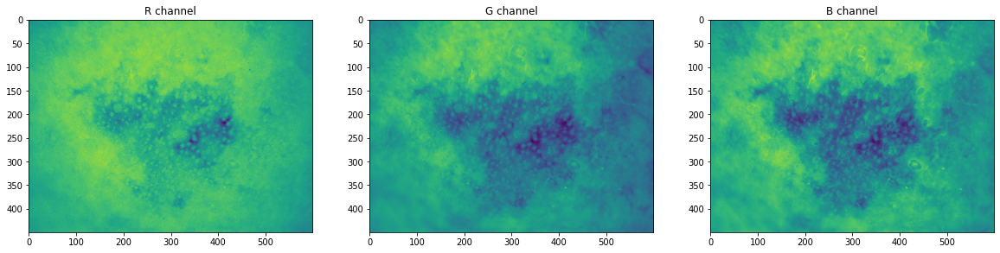

In [33]:
r = image7[:,:,0]
g = image7[:,:,1]
b = image7[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**8.VASCULAR LESION**

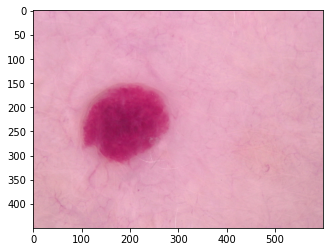

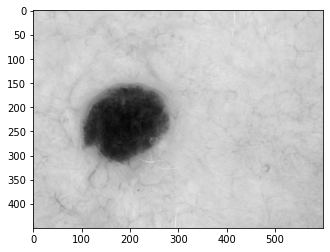

In [34]:
image8=skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/vascular lesion/ISIC_0025680.jpg")
plt.imshow(image8)

gray_image = skimage.color.rgb2gray(image8)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [35]:
image8

array([[[228, 164, 191],
        [226, 163, 190],
        [228, 164, 191],
        ...,
        [225, 167, 192],
        [223, 170, 188],
        [226, 173, 193]],

       [[226, 166, 191],
        [226, 166, 192],
        [227, 167, 193],
        ...,
        [228, 170, 194],
        [227, 172, 195],
        [229, 170, 198]],

       [[225, 166, 194],
        [225, 167, 192],
        [222, 166, 191],
        ...,
        [229, 171, 193],
        [224, 172, 194],
        [224, 170, 194]],

       ...,

       [[214, 160, 173],
        [213, 159, 175],
        [213, 160, 178],
        ...,
        [208, 153, 172],
        [205, 152, 170],
        [204, 153, 172]],

       [[217, 160, 179],
        [211, 157, 173],
        [213, 159, 175],
        ...,
        [210, 157, 173],
        [205, 153, 166],
        [203, 153, 165]],

       [[212, 155, 174],
        [209, 155, 171],
        [212, 155, 174],
        ...,
        [208, 156, 169],
        [207, 153, 167],
        [206, 152, 168]]

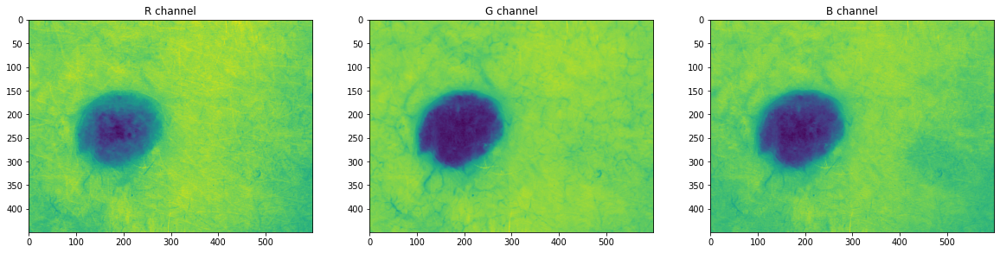

In [36]:
r = image8[:,:,0]
g = image8[:,:,1]
b = image8[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

**9.PIGMENTED BENGIN KERATOSIS**

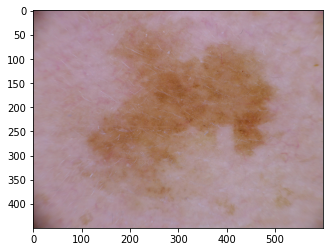

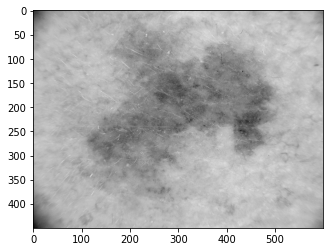

In [37]:
image9=skimage.io.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/pigmented benign keratosis/ISIC_0028258.jpg")
plt.imshow(image9)

gray_image = skimage.color.rgb2gray(image9)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

In [38]:
image9

array([[[102,  70,  75],
        [105,  73,  78],
        [105,  75,  77],
        ...,
        [151, 118, 125],
        [150, 117, 124],
        [148, 117, 123]],

       [[103,  71,  76],
        [105,  75,  77],
        [106,  76,  78],
        ...,
        [154, 116, 129],
        [152, 119, 128],
        [150, 117, 124]],

       [[104,  71,  78],
        [108,  76,  79],
        [109,  79,  81],
        ...,
        [152, 114, 129],
        [152, 114, 127],
        [152, 117, 124]],

       ...,

       [[ 84,  56,  52],
        [ 86,  58,  54],
        [ 90,  60,  58],
        ...,
        [139, 113, 114],
        [137, 112, 115],
        [138, 109, 113]],

       [[ 85,  56,  52],
        [ 88,  58,  56],
        [ 90,  59,  57],
        ...,
        [140, 111, 115],
        [138, 112, 115],
        [132, 110, 113]],

       [[ 81,  49,  50],
        [ 82,  52,  52],
        [ 86,  55,  53],
        ...,
        [137, 112, 115],
        [136, 111, 114],
        [136, 111, 115]]

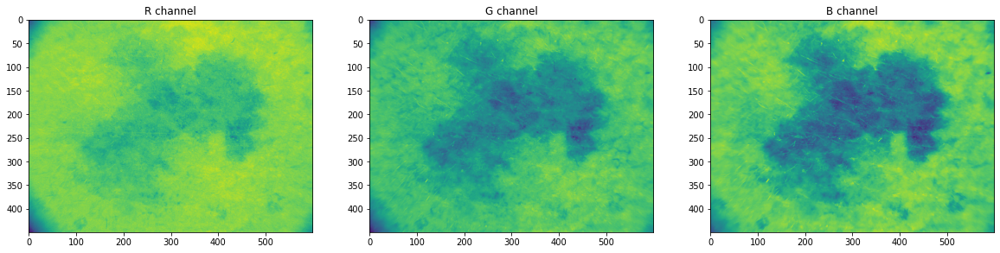

In [39]:
r = image9[:,:,0]
g = image9[:,:,1]
b = image9[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

In [40]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import  train_test_split
from sklearn.metrics import classification_report

In [41]:
data=[]
labels=[]

In [42]:
le=LabelEncoder()
labels=le.fit_transform(classes)

In [43]:
for image in images:
   
    data=skimage.io.imread(c_row['image'])
    gray_data=skimage.color.rgb2gray(data)
    
    

In [44]:
gray_data=np.array(gray_data)
labels=np.array(labels)

In [45]:
gray_data=gray_data.reshape(-1,1)
gray_data=gray_data[0:2239]

In [46]:
gray_data.shape

(2239, 1)

In [47]:
labels=labels.reshape(-1,1)

In [48]:
labels.shape

(2239, 1)

In [49]:
X_train,X_test,Y_train,Y_test=train_test_split(gray_data,labels,test_size=0.3,random_state=42)

**KNN MODEL**

In [50]:
model = KNeighborsClassifier(n_neighbors=15,metric='euclidean',weights='distance')
model.fit(X_train, Y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=15, weights='distance')

In [51]:
y_pred=model.predict(X_test)

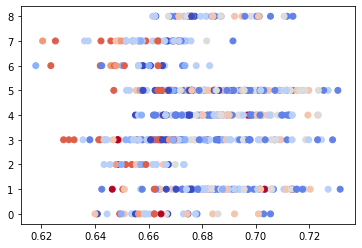

In [52]:
plt.scatter(
    X_test,Y_test,
    c=y_pred,
    cmap='coolwarm',
    alpha=1
)

In [53]:
from sklearn.metrics import accuracy_score
accuracy_score(Y_test, y_pred)

0.22321428571428573

In [54]:
print(classification_report(Y_test, model.predict(X_test), target_names=le.classes_))

                            precision    recall  f1-score   support

         actinic keratosis       0.08      0.13      0.10        31
      basal cell carcinoma       0.25      0.33      0.28       113
            dermatofibroma       0.12      0.18      0.15        22
                  melanoma       0.26      0.35      0.30       128
                     nevus       0.20      0.17      0.19       110
pigmented benign keratosis       0.27      0.18      0.22       151
      seborrheic keratosis       0.18      0.12      0.15        24
   squamous cell carcinoma       0.22      0.20      0.21        51
           vascular lesion       0.05      0.02      0.03        42

                  accuracy                           0.22       672
                 macro avg       0.18      0.19      0.18       672
              weighted avg       0.22      0.22      0.22       672



Text(0.5, 1.0, 'Confusion Matrix')

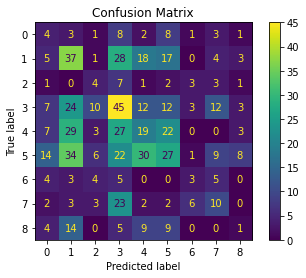

In [55]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(model, X_test, Y_test)
plt.title('Confusion Matrix')

**RANDOM FOREST MODEL**

In [56]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz

In [57]:
rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=2, min_samples_split=5, min_samples_leaf=20, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=3, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=2, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)

In [58]:
rf_model=rf.fit(X_train,Y_train)

In [59]:
y1_pred=rf_model.predict(X_test)

In [60]:
from sklearn.metrics import accuracy_score
accuracy_score(Y_test, y1_pred)

0.27380952380952384

**DEEP LEARNING IMPLEMENTATION IN IMAGE PROCESSING**

**Loading Libraries.........**

In [61]:
import tensorflow as tf                
from tqdm import tqdm
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.regularizers import l2

In [62]:
data_dir_train = pathlib.Path("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/")
data_dir_test = pathlib.Path("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/")

In [63]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


**MODEL 1**

In [64]:
image_size = (150,150)
batch_size = 32 
train_ds = tf.keras.preprocessing.image_dataset_from_directory("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train",
                                                               labels='inferred',
                                                                label_mode='int',
                                                                class_names=None,
                                                                color_mode='rgb',
                                                                batch_size=batch_size,
                                                                image_size=image_size,
                                                                shuffle=True,
                                                                seed=1337,
                                                                validation_split=0.2,
                                                                subset="training",
                                                                interpolation='bilinear',
                                                                follow_links=False,
                                                                crop_to_aspect_ratio=False
                                                              )
val_ds = tf.keras.preprocessing.image_dataset_from_directory("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train",
                                                            labels='inferred',
                                                                label_mode='int',
                                                                class_names=None,
                                                                color_mode='rgb',
                                                                batch_size=batch_size,
                                                                image_size=image_size,
                                                                shuffle=True,
                                                                seed=1337,
                                                                validation_split=0.2,
                                                                subset="validation",
                                                                interpolation='bilinear',
                                                                follow_links=False,
                                                                crop_to_aspect_ratio=False)

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


2022-12-02 06:59:47.925665: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [65]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.4)
])

In [66]:


train_ds = train_ds.prefetch(buffer_size = 32)
val_ds = val_ds.prefetch(buffer_size = 32)



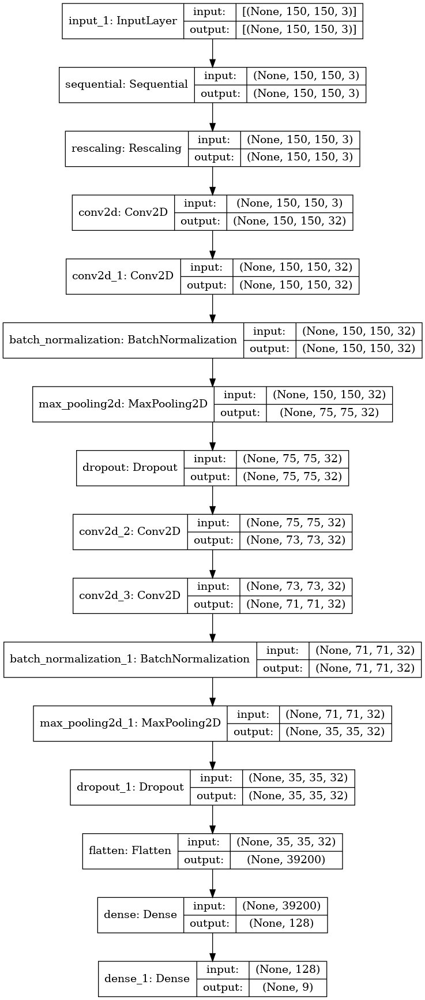

In [67]:


input_shape = (150,150,3)
inputs = keras.Input(shape = input_shape)
x = data_augmentation(inputs)
x = layers.Rescaling(1.0/255)(x)
x = layers.Conv2D(32, (3, 3), activation = 'relu', padding = 'Same', input_shape = (150, 150, 3))(x)
x = layers.Conv2D(32, (3, 3), activation = 'relu', padding = 'Same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(2,2)(x)
x = layers.Dropout(0.2)(x)
x = layers.Conv2D(32, (3, 3), activation = 'relu')(x)
x = layers.Conv2D(32, (3, 3), activation = 'relu')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D(2,2)(x)
x = layers.Dropout(0.2)(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation=tf.nn.relu)(x)
outputs = layers.Dense(9, activation=tf.nn.softmax)(x)

model = keras.Model(inputs, outputs)
keras.utils.plot_model(model, show_shapes=True)



In [68]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

In [69]:
epochs = 35

callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.h5"),
]
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
)
model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=val_ds,
)

Epoch 1/35


2022-12-02 06:59:53.229069: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


56/56 [==============================] - 60s 994ms/step - loss: 4.9854 - accuracy: 0.2801 - val_loss: 11.6546 - val_accuracy: 0.2282
Epoch 2/35
56/56 [==============================] - 55s 955ms/step - loss: 1.9443 - accuracy: 0.3153 - val_loss: 14.9103 - val_accuracy: 0.2349
Epoch 3/35
56/56 [==============================] - 55s 949ms/step - loss: 1.9072 - accuracy: 0.3532 - val_loss: 11.9662 - val_accuracy: 0.1812
Epoch 4/35
56/56 [==============================] - 55s 957ms/step - loss: 1.7906 - accuracy: 0.3750 - val_loss: 13.8801 - val_accuracy: 0.2349
Epoch 5/35
56/56 [==============================] - 53s 922ms/step - loss: 1.6868 - accuracy: 0.3767 - val_loss: 6.8725 - val_accuracy: 0.1230
Epoch 6/35
56/56 [==============================] - 53s 923ms/step - loss: 1.7253 - accuracy: 0.4074 - val_loss: 10.4371 - val_accuracy: 0.2036
Epoch 7/35
56/56 [==============================] - 53s 920ms/step - loss: 1.6365 - accuracy: 0.4559 - val_loss: 2.6930 - val_accuracy: 0.3378
Epoch

**MODEL 2**

In [70]:
batch_size = 32
img_height = 180
img_width = 180

In [71]:
train_ds = image_dataset_from_directory(data_dir_train, 
                                        seed = 123, 
                                        image_size=(img_height, img_width), 
                                        validation_split=0.2, 
                                        subset='training')

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [72]:
val_ds = image_dataset_from_directory(data_dir_train, 
                                      seed = 123, 
                                      image_size=(img_height, img_width), 
                                      validation_split=0.2, 
                                      subset='validation')

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [73]:
class_names = train_ds.class_names
print(type(class_names), class_names)

<class 'list'> ['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [74]:
for image_batch, labels_batch in train_ds.take(1):
    print(image_batch.shape)
    print(labels_batch.shape)

(32, 180, 180, 3)
(32,)


In [75]:
data_augmentation = tf.keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(img_height, 
                                                              img_width,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.5),
    layers.experimental.preprocessing.RandomZoom(0.5)
  ]
)

In [76]:
num_classes = 9

# Model - Rescaling -> Conv2D -> MaxPooling2D -> Dropout -> Conv2D -> MaxPooling2D -> Dropout -> Conv2D -> MaxPooling2D -> Dropout -> Dense -> Dense
model = Sequential()
model.add(layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)))
model.add(Conv2D(16, 3, padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(32, 3, padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Conv2D(64, 3, padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D())
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dense(num_classes))

In [77]:
model.compile(optimizer='adam',
              loss=SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [78]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 180, 180, 16)      448       
_________________________________________________________________
activation (Activation)      (None, 180, 180, 16)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 90, 90, 16)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 90, 90, 16)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 90, 90, 32)        4640      
_________________________________________________________________
activation_1 (Activation)    (None, 90, 90, 32)       

In [79]:
epochs = 35
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/35
56/56 [==============================] - 22s 362ms/step - loss: 2.3731 - accuracy: 0.1892 - val_loss: 2.0755 - val_accuracy: 0.2058
Epoch 2/35
56/56 [==============================] - 22s 373ms/step - loss: 2.0252 - accuracy: 0.2054 - val_loss: 2.0609 - val_accuracy: 0.1969
Epoch 3/35
56/56 [==============================] - 22s 375ms/step - loss: 1.9909 - accuracy: 0.2422 - val_loss: 2.0202 - val_accuracy: 0.2461
Epoch 4/35
56/56 [==============================] - 21s 362ms/step - loss: 1.7935 - accuracy: 0.3493 - val_loss: 1.7254 - val_accuracy: 0.4094
Epoch 5/35
56/56 [==============================] - 22s 372ms/step - loss: 1.6455 - accuracy: 0.4146 - val_loss: 1.6039 - val_accuracy: 0.4452
Epoch 6/35
56/56 [==============================] - 22s 370ms/step - loss: 1.5755 - accuracy: 0.4369 - val_loss: 1.5578 - val_accuracy: 0.4631
Epoch 7/35
56/56 [==============================] - 21s 360ms/step - loss: 1.5351 - accuracy: 0.4537 - val_loss: 1.5175 - val_accuracy: 0.4564

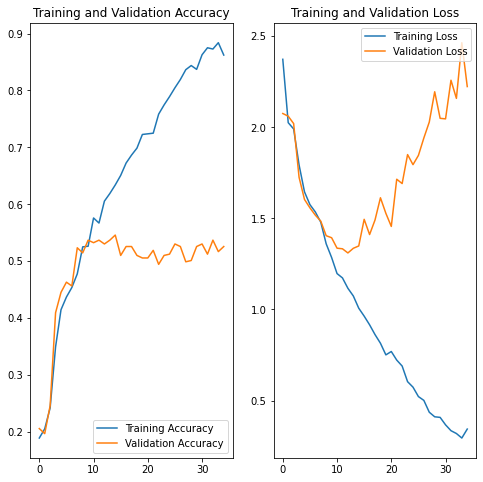

In [80]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()